# **UPLOAD DATASET USING MY KAGGLE API TOKEN**

In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mohammadmehedihasanc","key":"79d5077f2be25e6d2eebfe4d58199c4a"}'}

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/


# Set Permissions: Set appropriate permissions for the Kaggle API key file by running the following command:

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d kaiska/apparel-dataset


 95% 153M/161M [00:02<00:00, 72.1MB/s]
100% 161M/161M [00:02<00:00, 76.8MB/s]


In [ ]:
!unzip apparel-dataset.zip


Streaming output truncated to the last 5000 lines.
  inflating: red_shirt/137.jpg       
  inflating: red_shirt/138.jpg       
  inflating: red_shirt/139.jpg       
  inflating: red_shirt/14.jpg        
  inflating: red_shirt/140.jpg       
  inflating: red_shirt/141.jpg       
  inflating: red_shirt/142.jpg       
  inflating: red_shirt/143.jpg       
  inflating: red_shirt/144.jpg       
  inflating: red_shirt/145.jpg       
  inflating: red_shirt/146.jpg       
  inflating: red_shirt/147.jpg       
  inflating: red_shirt/148.jpg       
  inflating: red_shirt/149.jpg       
  inflating: red_shirt/15.jpg        
  inflating: red_shirt/150.jpg       
  inflating: red_shirt/151.jpg       
  inflating: red_shirt/152.jpg       
  inflating: red_shirt/153.jpg       
  inflating: red_shirt/154.jpg       
  inflating: red_shirt/155.jpg       
  inflating: red_shirt/156.jpg       
  inflating: red_shirt/157.jpg       
  inflating: red_shirt/158.jpg       
  inflating: red_shirt/159.jpg       

# **Explore the Dataset**

In [ ]:
!ls


black_dress   blue_dress    brown_pants   green_suit   red_pants     white_dress   yellow_shorts
black_pants   blue_pants    brown_shoes   pink_hoodie  red_shirt     white_pants   yellow_skirt
black_shirt   blue_shirt    green_pants   pink_pants   red_shoes     white_shoes
black_shoes   blue_shoes    green_shirt   pink_skirt   sample_data   white_shorts
black_shorts  blue_shorts   green_shoes   red_dress    silver_shoes  white_suit
black_suit    brown_hoodie  green_shorts  red_hoodie   silver_skirt  yellow_dress


# Explore the dataset and display sample images in a grid per category

Category: .config, Number of Images: 0


<Figure size 1200x300 with 0 Axes>

Category: green_suit, Number of Images: 243


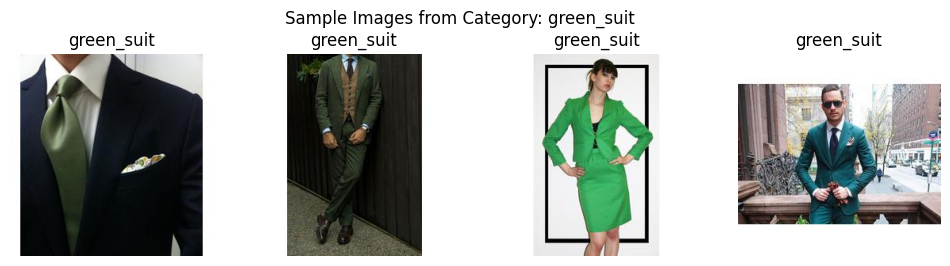

Category: red_hoodie, Number of Images: 349


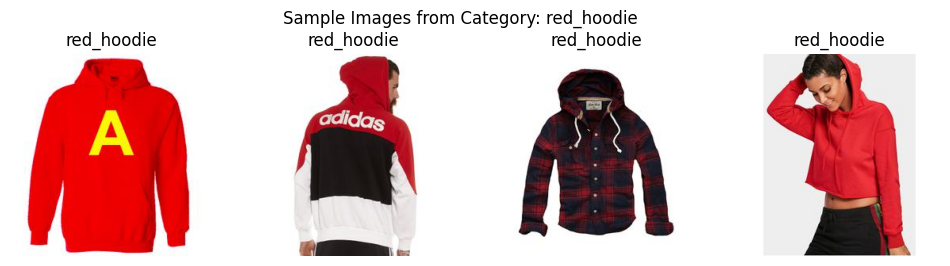

Category: yellow_skirt, Number of Images: 409


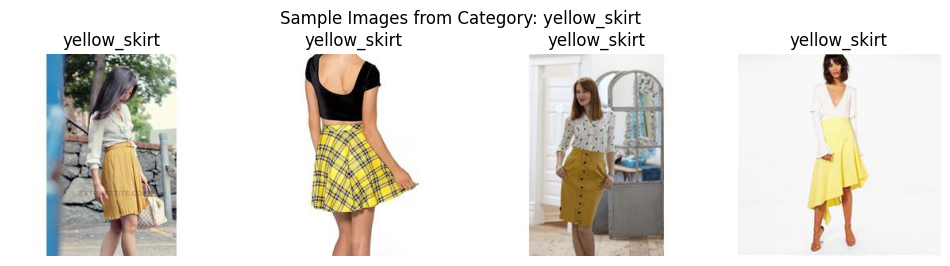

Category: white_suit, Number of Images: 354


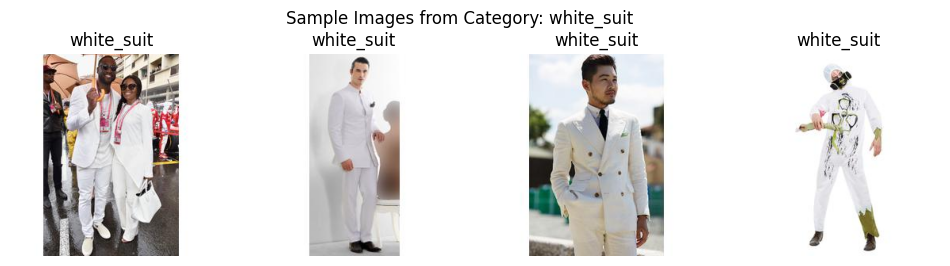

Category: blue_pants, Number of Images: 798


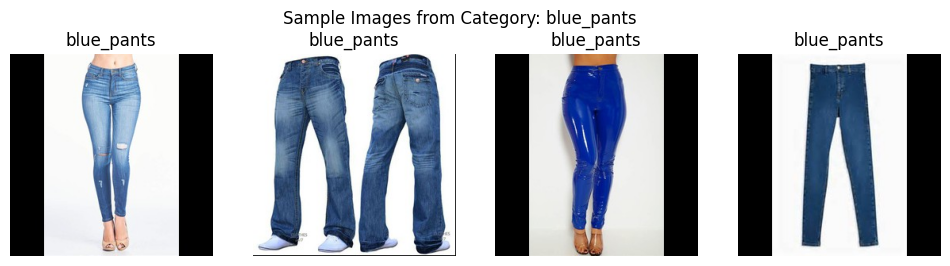

Category: brown_pants, Number of Images: 311


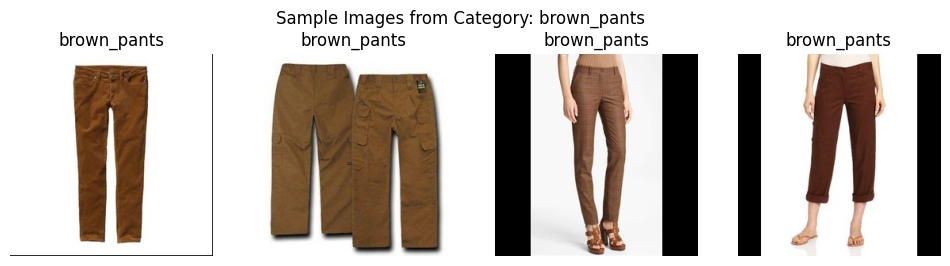

Category: blue_shirt, Number of Images: 741


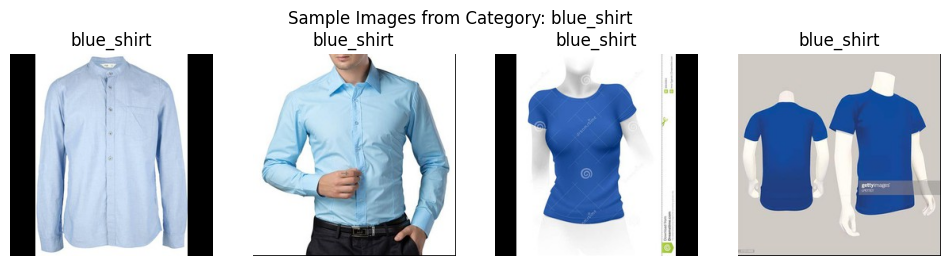

Category: green_pants, Number of Images: 227


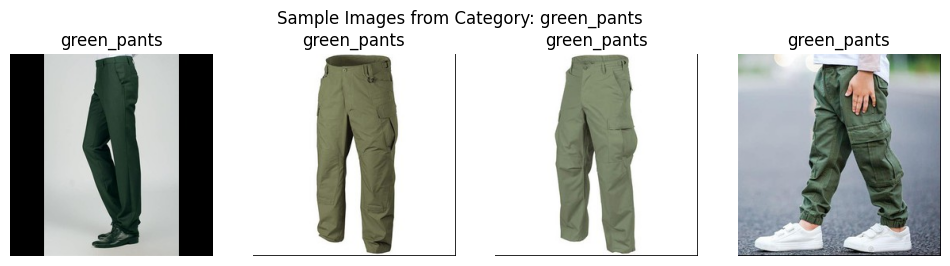

Category: black_shorts, Number of Images: 328


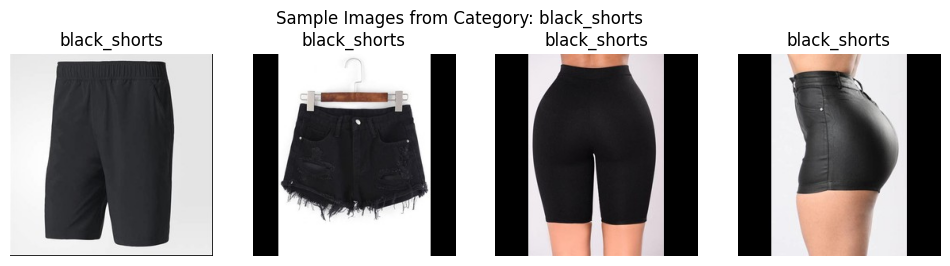

Category: green_shorts, Number of Images: 135


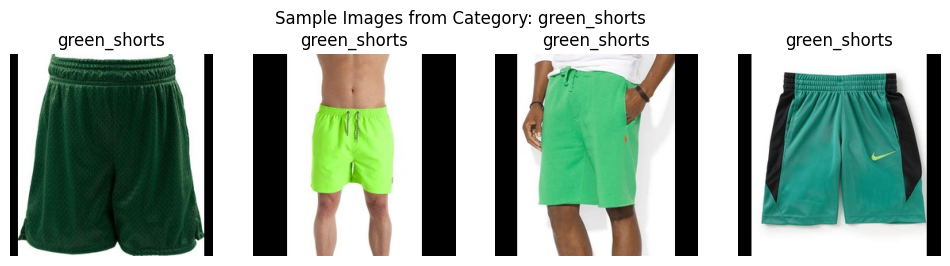

Category: brown_hoodie, Number of Images: 188


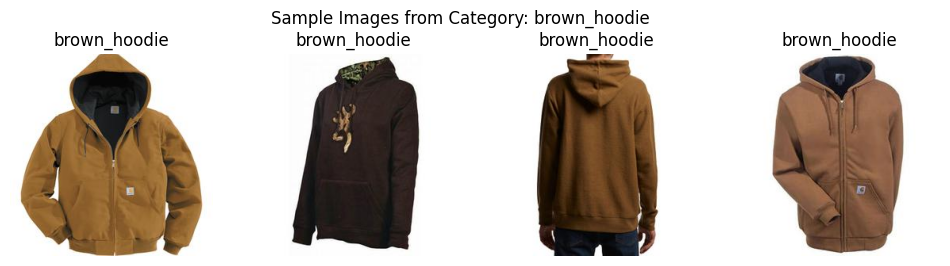

Category: red_pants, Number of Images: 308


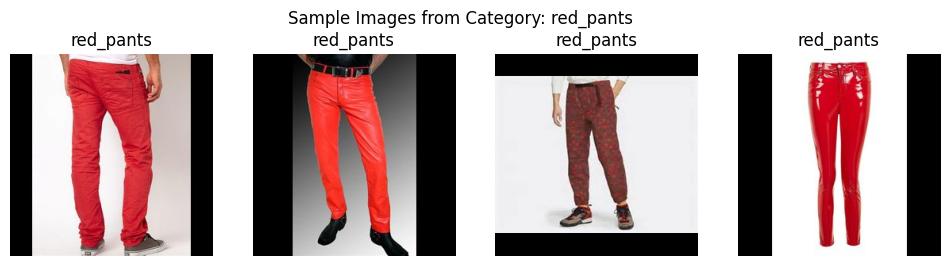

Category: white_shoes, Number of Images: 600


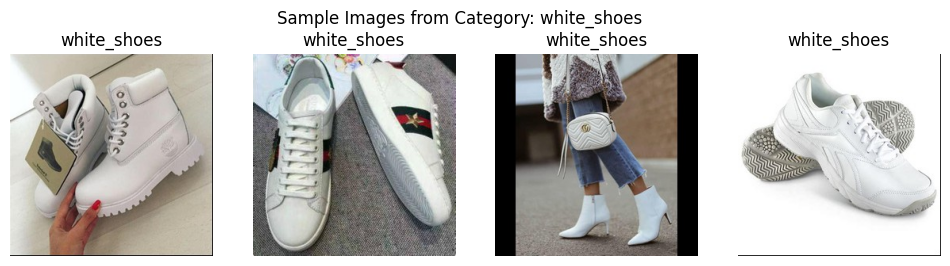

Category: pink_skirt, Number of Images: 513


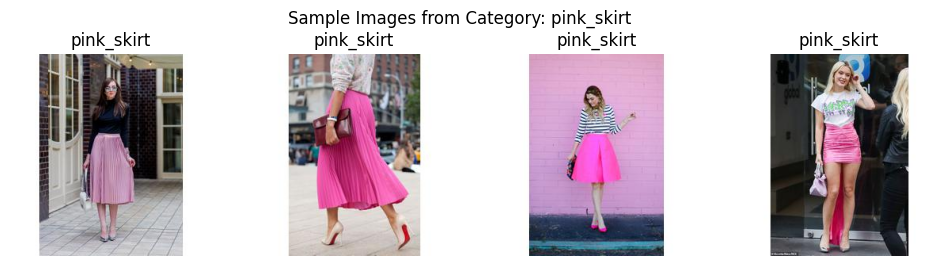

Category: blue_shoes, Number of Images: 523


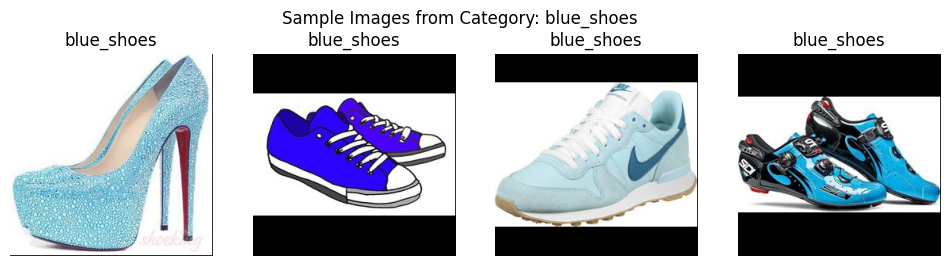

Category: blue_shorts, Number of Images: 299


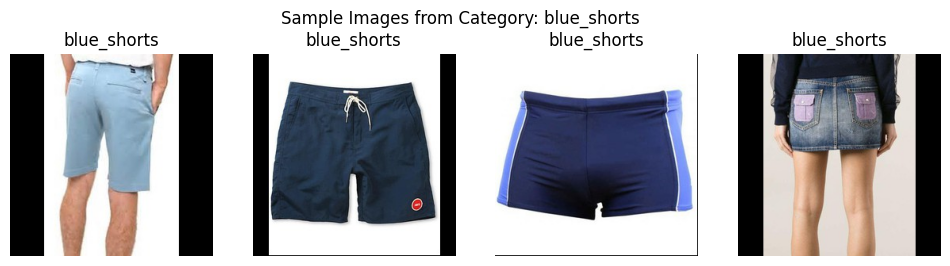

Category: yellow_dress, Number of Images: 566


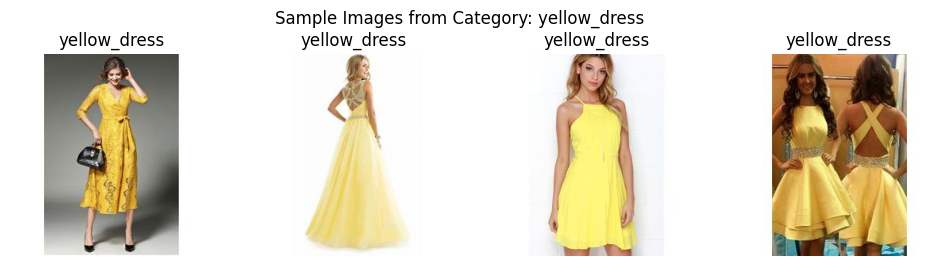

Category: .ipynb_checkpoints, Number of Images: 0


<Figure size 1200x300 with 0 Axes>

Category: red_dress, Number of Images: 800


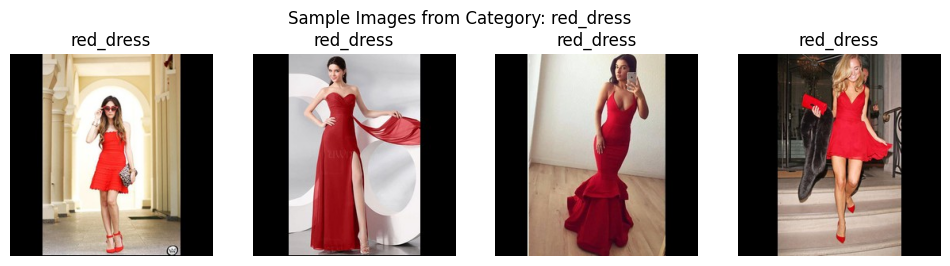

Category: white_shorts, Number of Images: 120


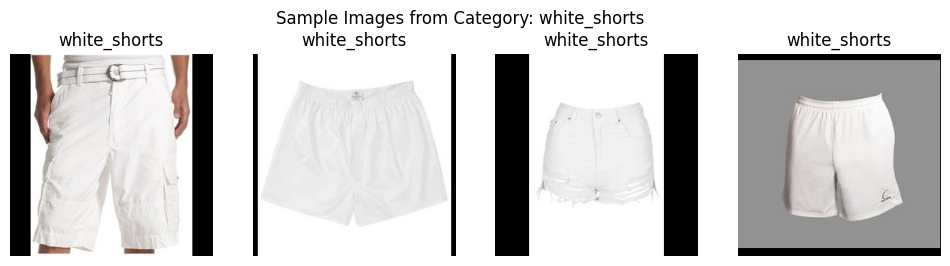

Category: red_shirt, Number of Images: 332


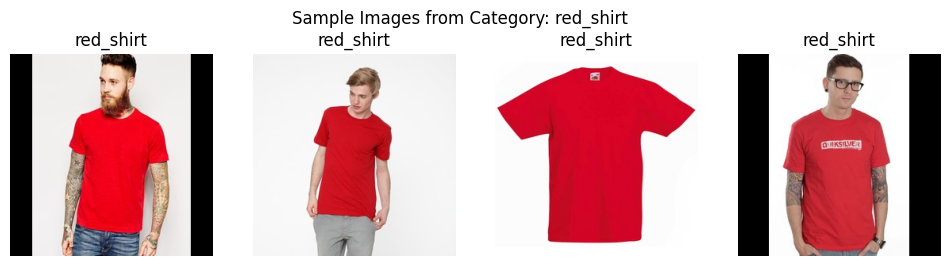

Category: black_dress, Number of Images: 450


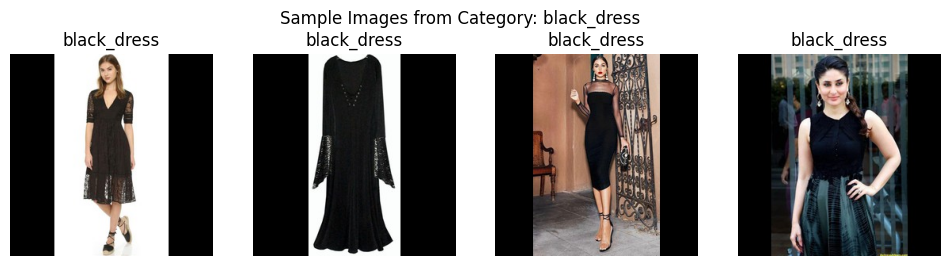

Category: black_shirt, Number of Images: 715


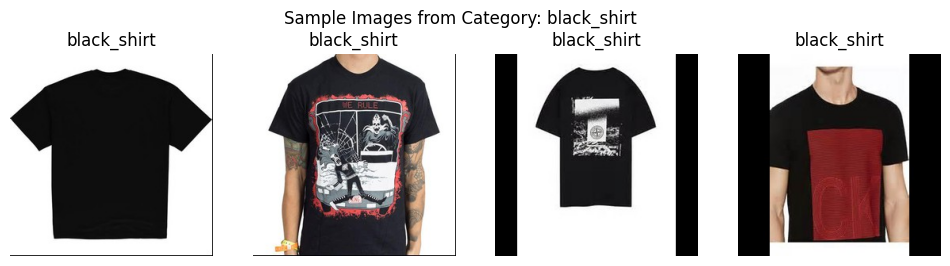

Category: silver_skirt, Number of Images: 361


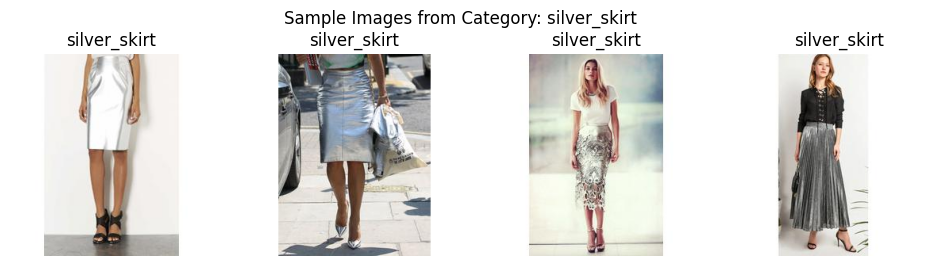

Category: green_shoes, Number of Images: 455


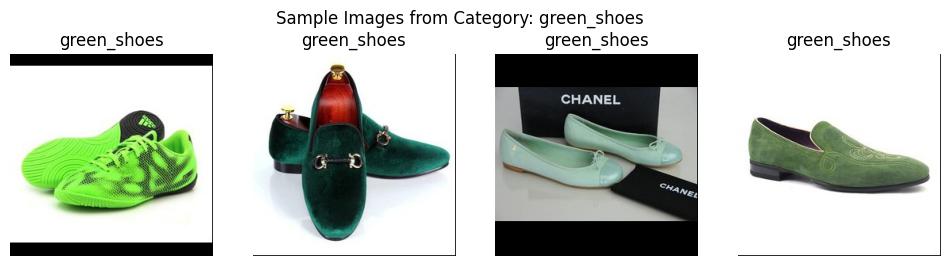

Category: black_shoes, Number of Images: 766


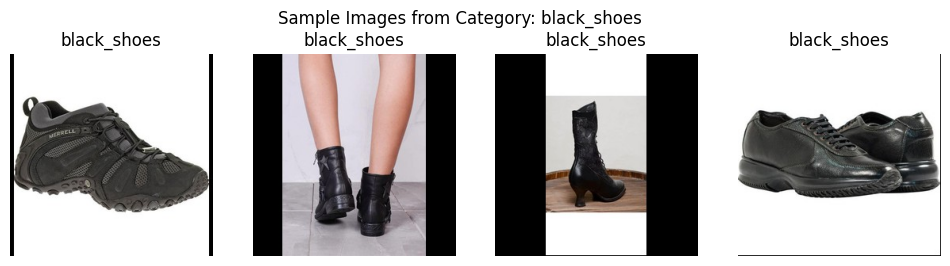

Category: brown_shoes, Number of Images: 464


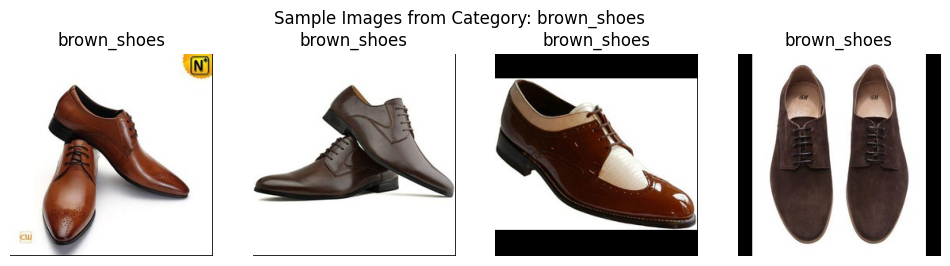

Category: pink_pants, Number of Images: 246


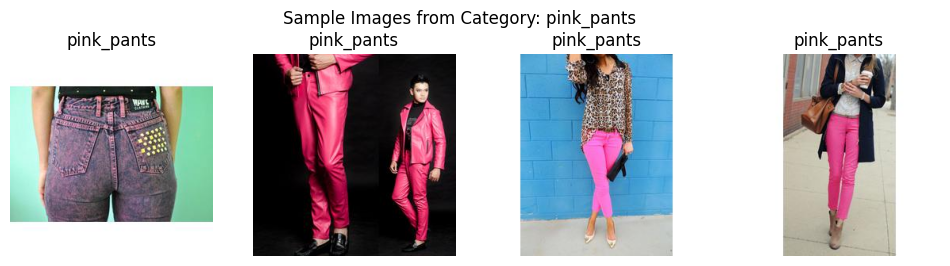

Category: red_shoes, Number of Images: 610


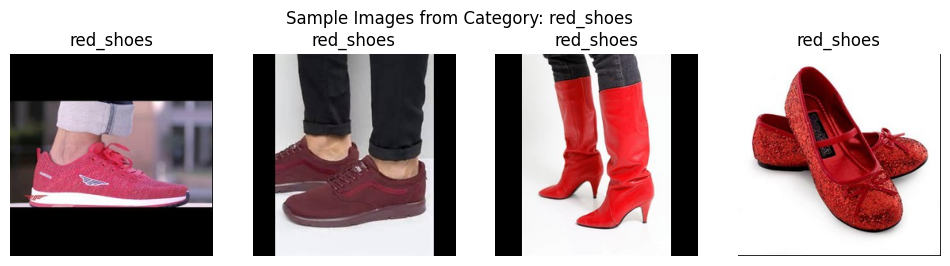

Category: silver_shoes, Number of Images: 403


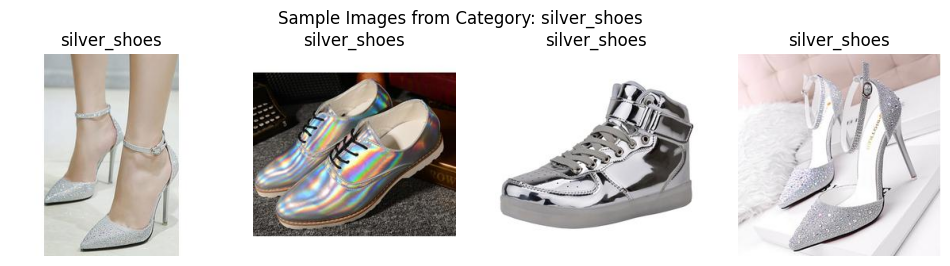

Category: black_pants, Number of Images: 870


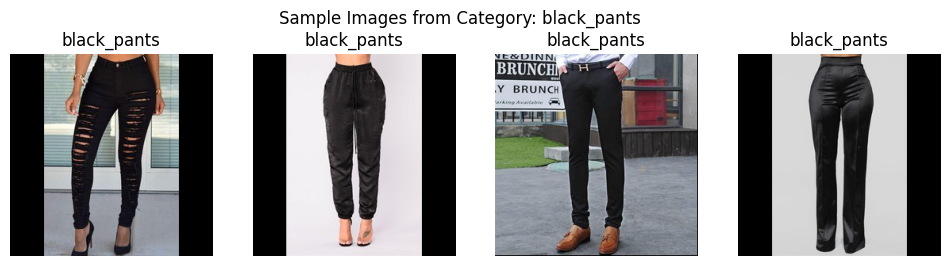

Category: pink_hoodie, Number of Images: 347


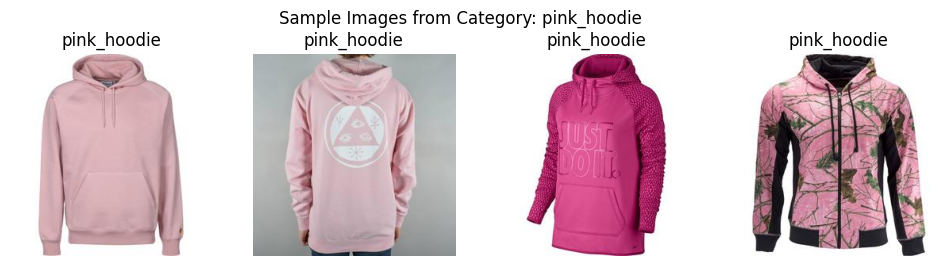

Category: blue_dress, Number of Images: 502


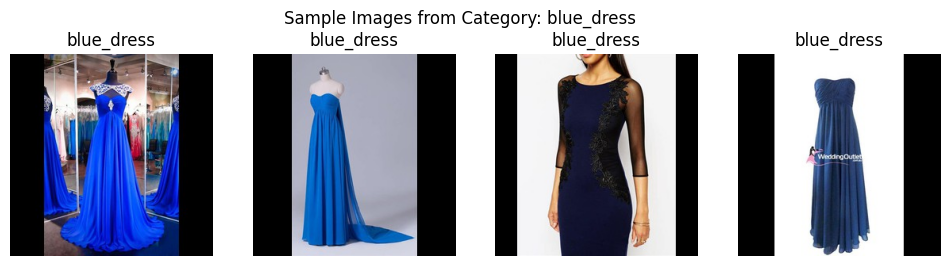

Category: white_pants, Number of Images: 274


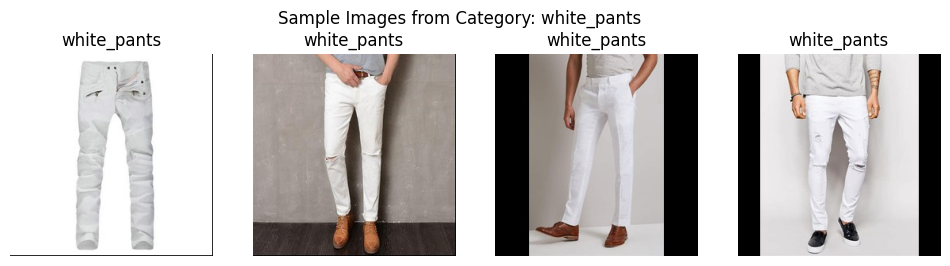

Category: white_dress, Number of Images: 818


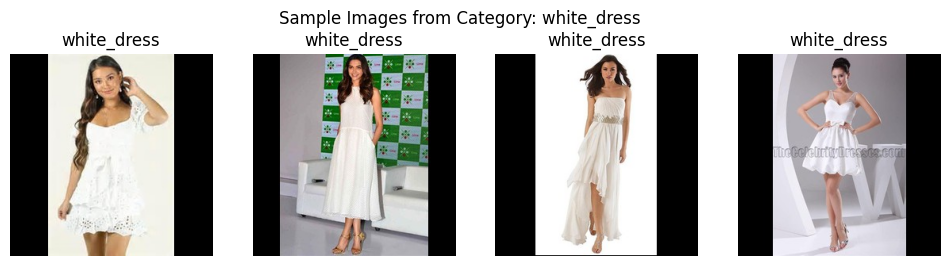

Category: green_shirt, Number of Images: 230


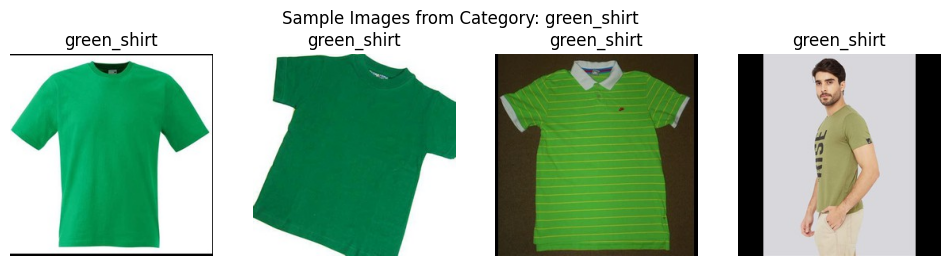

Category: yellow_shorts, Number of Images: 195


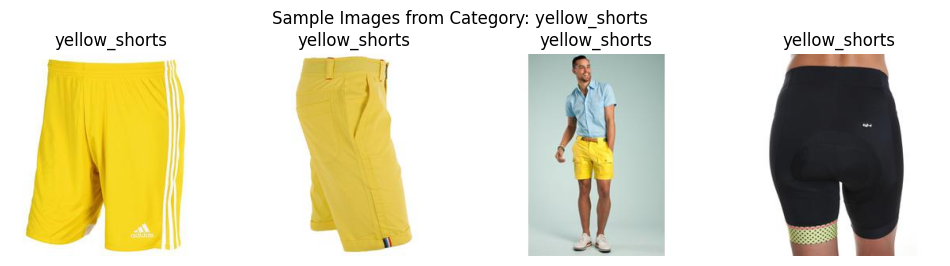

Category: black_suit, Number of Images: 320


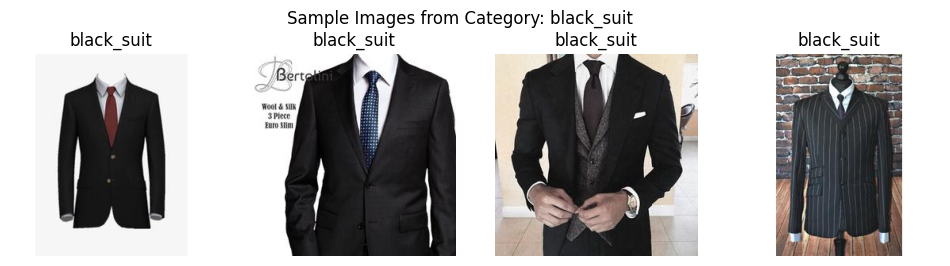

Category: sample_data, Number of Images: 0


<Figure size 1200x300 with 0 Axes>

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

dataset_dir = '/content/'

def explore_dataset(dataset_dir): # Function to explore the dataset and display sample images in a grid per category
    categories = os.listdir(dataset_dir)
    category_counts = {}  # Dictionary to store category-wise image counts
    total_images = 0  # Total number of images in the dataset

    num_samples_per_category = 4

    # Iterate through each category
    for category in categories:
        category_dir = os.path.join(dataset_dir, category)
        if os.path.isdir(category_dir):
            images = [f for f in os.listdir(category_dir) if f.endswith('.jpg')]
            category_counts[category] = len(images)
            total_images += len(images)
            print(f"Category: {category}, Number of Images: {len(images)}")


            num_cols = 4  # Number of columns in the grid # Display sample images from each category in a grid
            num_rows = (num_samples_per_category + num_cols - 1) // num_cols  # Calculate the number of rows
            plt.figure(figsize=(12, 3 * num_rows))  # Set figure size based on the number of rows

            for i, img_name in enumerate(images[:num_samples_per_category]):
                img_path = os.path.join(category_dir, img_name)
                try:
                    img = Image.open(img_path)
                    plt.subplot(num_rows, num_cols, i + 1)  # Create subplot
                    plt.imshow(img)
                    plt.title(category)
                    plt.axis('off')
                except Exception as e:
                    print(f"Error opening image {img_name}: {e}")

            plt.suptitle(f'Sample Images from Category: {category}')  # Set main title for the grid
            plt.show()
explore_dataset(dataset_dir)


# Explore the dataset and print total number of images and distribution across categories

Total number of images in the dataset: 16170


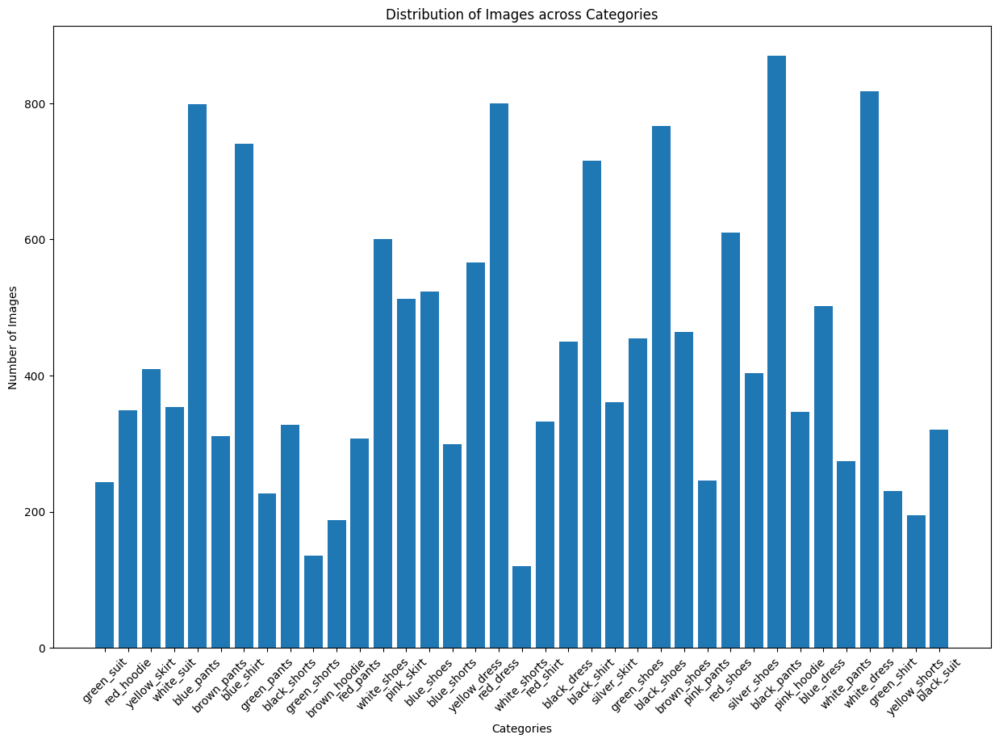

In [ ]:
# Function to explore the dataset and print total number of images and distribution across categories
def explore_dataset(dataset_dir):
    categories = os.listdir(dataset_dir)
    category_counts = {}
    total_images = 0  # Total number of images in the dataset

    # Iterate through each category
    for category in categories:
        category_dir = os.path.join(dataset_dir, category)
        if os.path.isdir(category_dir):
            images = [f for f in os.listdir(category_dir) if f.endswith('.jpg')]
            if images:  # Check if the category contains image files
                category_counts[category] = len(images)
                total_images += len(images)

    # Print total number of images in the dataset
    print(f"Total number of images in the dataset: {total_images}")

    # Plot distribution of images across categories
    plt.figure(figsize=(15, 10))
    plt.bar(category_counts.keys(), category_counts.values())
    plt.xlabel('Categories')
    plt.ylabel('Number of Images')
    plt.title('Distribution of Images across Categories')
    plt.xticks(rotation=45)
    plt.show()
explore_dataset(dataset_dir)


# **Preprocessing STEPS**

# **Resize Images**

# Resize images to 64x64 pixels

In [ ]:
import os
from PIL import Image

# Define the directory where the resized images will be saved
resized_dir = '/content/resized_images'
os.makedirs(resized_dir, exist_ok=True)

# Define the directory where the original dataset is located
original_dir = '/content/'

# Function to resize images
def resize_images(original_dir, resized_dir, target_size=(64, 64)):
    categories = os.listdir(original_dir)

    # Iterate through each category
    for category in categories:
        category_dir = os.path.join(original_dir, category)
        resized_category_dir = os.path.join(resized_dir, category)
        os.makedirs(resized_category_dir, exist_ok=True)

        # Check if the category directory is a valid directory
        if os.path.isdir(category_dir):
            # Iterate through each image in the category
            for img_name in os.listdir(category_dir):
                img_path = os.path.join(category_dir, img_name)
                resized_img_path = os.path.join(resized_category_dir, img_name)

                # Check if the file is an image
                if img_name.endswith('.jpg') or img_name.endswith('.jpeg') or img_name.endswith('.png'):
                    # Open and resize the image
                    try:
                        img = Image.open(img_path)
                        img_resized = img.resize(target_size, Image.ANTIALIAS)
                        img_resized.save(resized_img_path)
                    except Exception as e:
                        print(f"Error resizing image {img_name}: {e}")
                else:
                    print(f"Ignore non-image file: {img_name}")
resize_images(original_dir, resized_dir)


Ignore non-image file: active_config
Ignore non-image file: gce
Ignore non-image file: configurations
Ignore non-image file: .last_update_check.json
Ignore non-image file: logs
Ignore non-image file: .last_opt_in_prompt.yaml
Ignore non-image file: .last_survey_prompt.yaml
Ignore non-image file: config_sentinel
Ignore non-image file: default_configs.db


<ipython-input-10-099811a40702>:33: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img_resized = img.resize(target_size, Image.ANTIALIAS)


Ignore non-image file: green_suit
Ignore non-image file: red_hoodie
Ignore non-image file: yellow_skirt
Ignore non-image file: white_suit
Ignore non-image file: blue_pants
Ignore non-image file: brown_pants
Ignore non-image file: blue_shirt
Ignore non-image file: green_pants
Ignore non-image file: .config
Ignore non-image file: black_shorts
Ignore non-image file: green_shorts
Ignore non-image file: brown_hoodie
Ignore non-image file: red_pants
Ignore non-image file: white_shoes
Ignore non-image file: resized_images
Ignore non-image file: README.md
Ignore non-image file: anscombe.json
Ignore non-image file: california_housing_train.csv
Ignore non-image file: mnist_train_small.csv
Ignore non-image file: california_housing_test.csv
Ignore non-image file: mnist_test.csv


# Show resized images

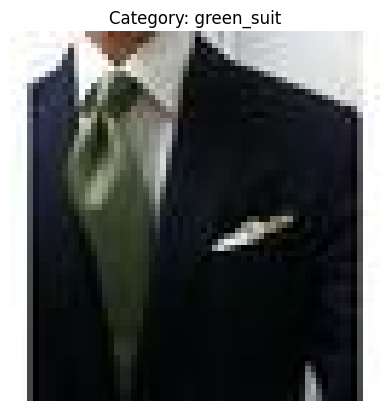

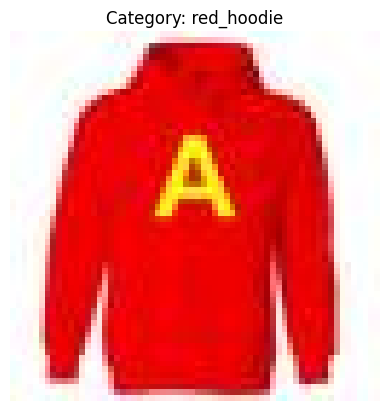

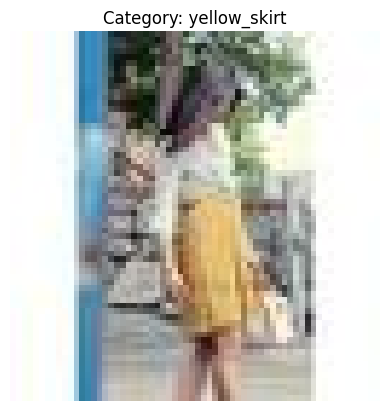

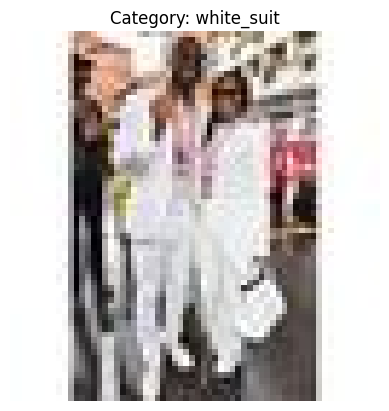

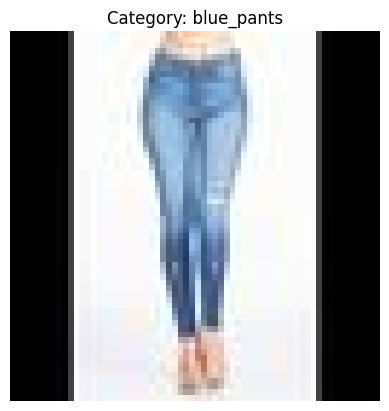

...

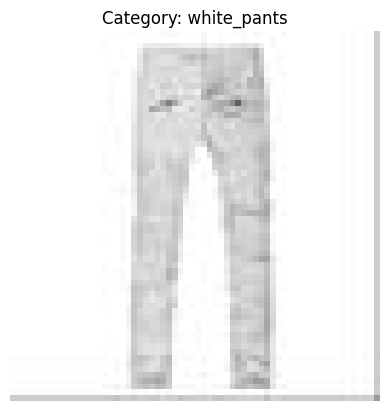

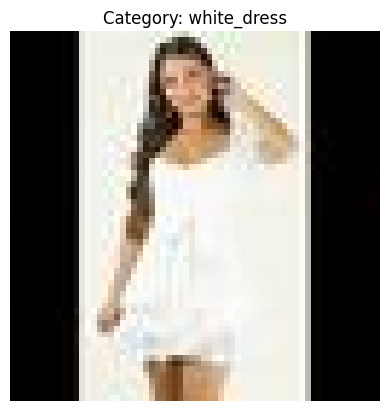

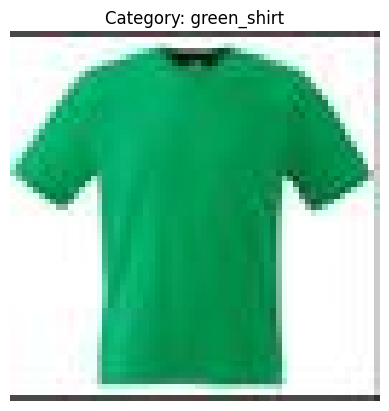

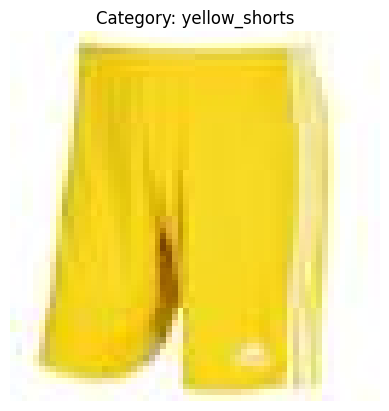

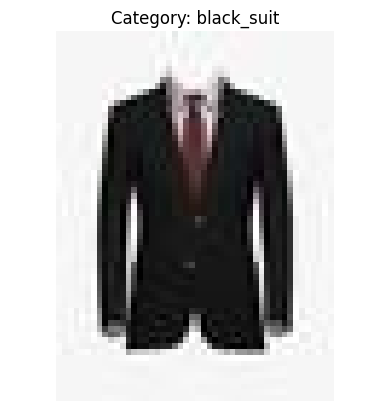

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
# Function to show resized images
def show_resized_images(resized_dir, num_images=1):
    categories = os.listdir(resized_dir)

    # Iterate through each category
    for category in categories:
        category_dir = os.path.join(resized_dir, category)

        # Check if the category directory is a valid directory
        if os.path.isdir(category_dir):
            # Get a list of resized image files in the category directory
            image_files = [f for f in os.listdir(category_dir) if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png')]

            # Display num_images resized images from the category
            for img_name in image_files[:num_images]:
                img_path = os.path.join(category_dir, img_name)
                try:
                    img = Image.open(img_path)
                    plt.imshow(img)
                    plt.title(f"Category: {category}")
                    plt.axis('off')
                    plt.show()
                except Exception as e:
                    print(f"Error opening image {img_name}: {e}")
show_resized_images(resized_dir, num_images=1)


# **Convert Images: convert_to_grayscale**

In [ ]:
import os
from PIL import Image

# Define the directory where the grayscale images will be saved
grayscale_dir = '/content/grayscale_images'
os.makedirs(grayscale_dir, exist_ok=True)

# Define the directory where the resized images are located
resized_dir = '/content/resized_images'

# Function to convert images to grayscale
def convert_to_grayscale(resized_dir, grayscale_dir):
    categories = os.listdir(resized_dir)

    # Iterate through each category
    for category in categories:
        category_dir = os.path.join(resized_dir, category)
        grayscale_category_dir = os.path.join(grayscale_dir, category)
        os.makedirs(grayscale_category_dir, exist_ok=True)

        # Check if the category directory is a valid directory
        if os.path.isdir(category_dir):
            # Iterate through each image in the category
            for img_name in os.listdir(category_dir):
                img_path = os.path.join(category_dir, img_name)
                grayscale_img_path = os.path.join(grayscale_category_dir, img_name)

                # Open and convert the image to grayscale
                try:
                    img = Image.open(img_path).convert('L')
                    img.save(grayscale_img_path)
                except Exception as e:
                    print(f"Error converting image {img_name}: {e}")

# Convert images to grayscale
convert_to_grayscale(resized_dir, grayscale_dir)


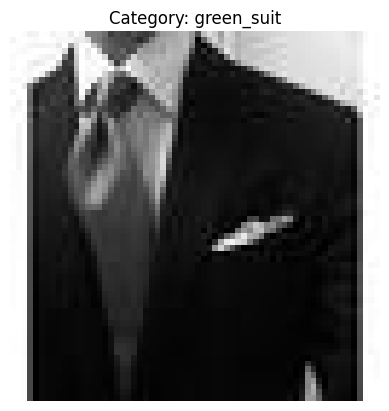

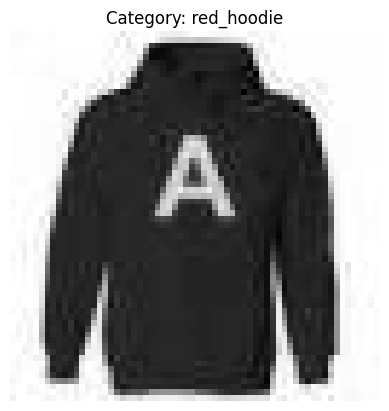

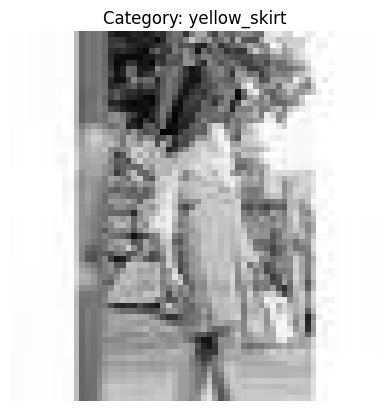

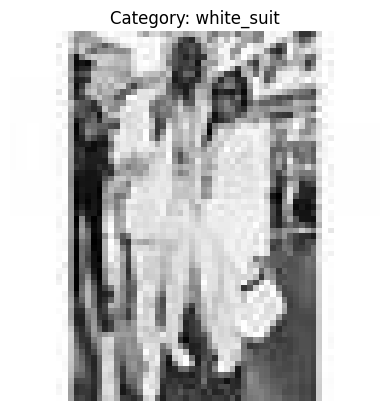

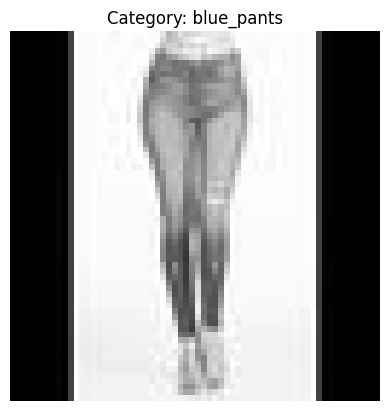

...

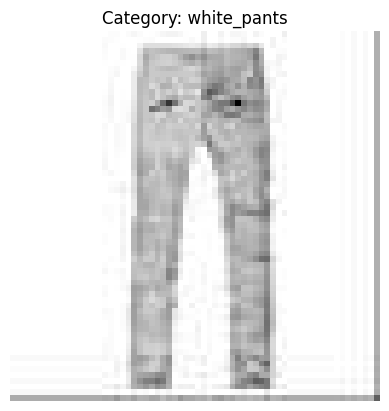

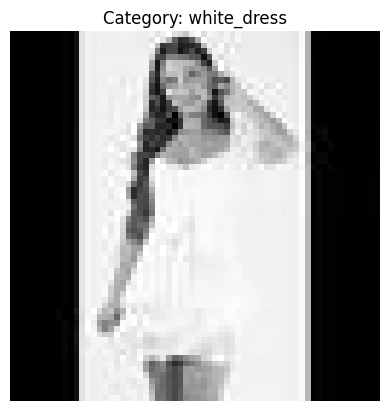

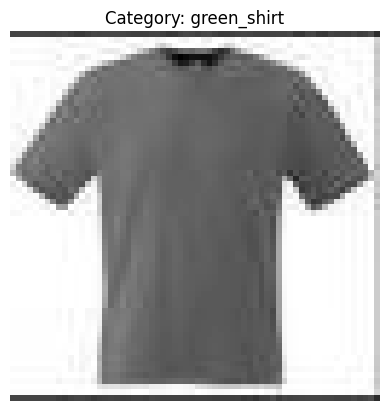

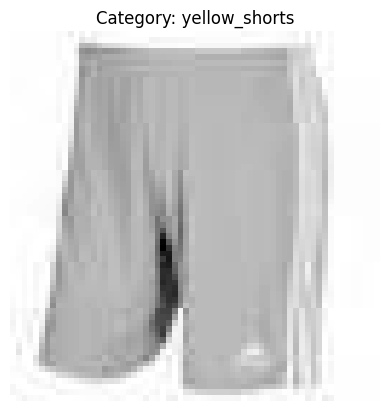

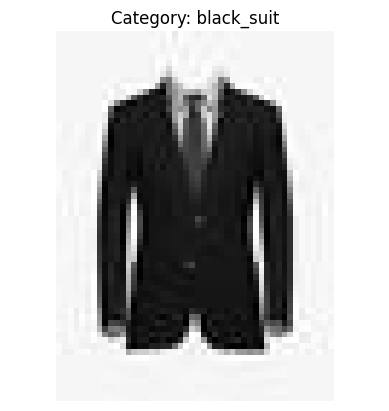

In [ ]:
# Function to show one grayscale image per category
def show_grayscale_images(grayscale_dir):
    categories = os.listdir(grayscale_dir)

    # Iterate through each category
    for category in categories:
        category_dir = os.path.join(grayscale_dir, category)

        # Check if the category directory is a valid directory
        if os.path.isdir(category_dir):
            # Get a list of grayscale image files in the category directory
            image_files = [f for f in os.listdir(category_dir) if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png')]

            # Display one grayscale image from the category
            if image_files:
                img_path = os.path.join(category_dir, image_files[0])
                try:
                    img = Image.open(img_path)
                    plt.imshow(img, cmap='gray')
                    plt.title(f"Category: {category}")
                    plt.axis('off')
                    plt.show()
                except Exception as e:
                    print(f"Error opening image {image_files[0]}: {e}")

# Show one grayscale image per category
show_grayscale_images(grayscale_dir)


# **Normalize Pixel Values**

In [ ]:
import os
from PIL import Image
import numpy as np

# Define the directory where the normalized images will be saved
normalized_dir = '/content/normalized_images'
os.makedirs(normalized_dir, exist_ok=True)

# Define the directory where the grayscale images are located
grayscale_dir = '/content/grayscale_images'

# Function to normalize pixel values
def normalize_images(grayscale_dir, normalized_dir):
    categories = os.listdir(grayscale_dir)

    # Iterate through each category
    for category in categories:
        category_dir = os.path.join(grayscale_dir, category)
        normalized_category_dir = os.path.join(normalized_dir, category)
        os.makedirs(normalized_category_dir, exist_ok=True)

        # Check if the category directory is a valid directory
        if os.path.isdir(category_dir):
            # Iterate through each image in the category
            for img_name in os.listdir(category_dir):
                img_path = os.path.join(category_dir, img_name)
                normalized_img_path = os.path.join(normalized_category_dir, img_name)

                # Open the image and normalize pixel values
                try:
                    img = Image.open(img_path)
                    img_array = np.array(img)
                    normalized_img_array = img_array / 255.0  # Normalize pixel values
                    normalized_img_array = (normalized_img_array * 255).astype(np.uint8)  # Convert back to uint8
                    normalized_img = Image.fromarray(normalized_img_array)
                    normalized_img = normalized_img.convert('L')  # Convert mode to 'L' (grayscale)
                    normalized_img.save(normalized_img_path)
                except Exception as e:
                    print(f"Error normalizing image {img_name}: {e}")

# Normalize pixel values to [0, 1]
normalize_images(grayscale_dir, normalized_dir)


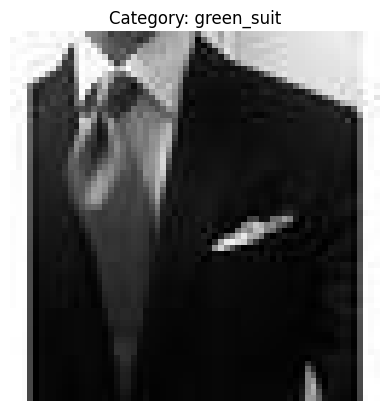

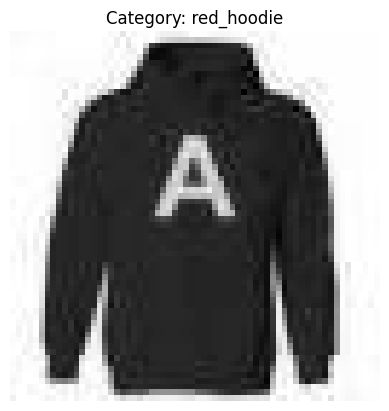

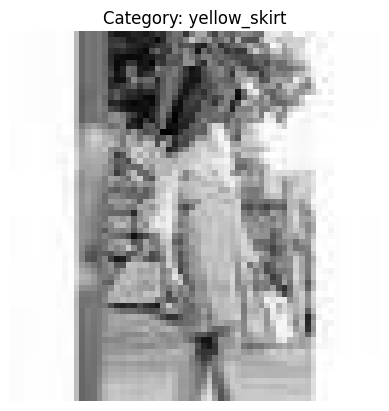

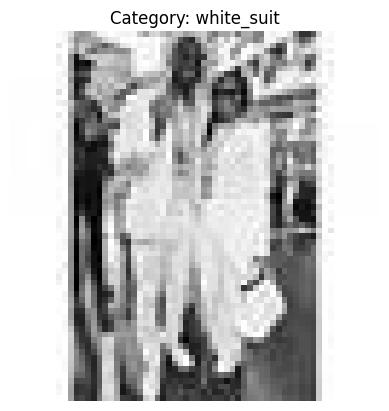

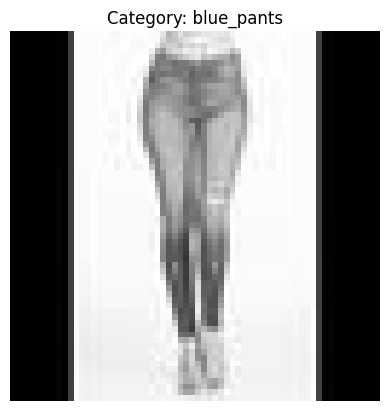

...

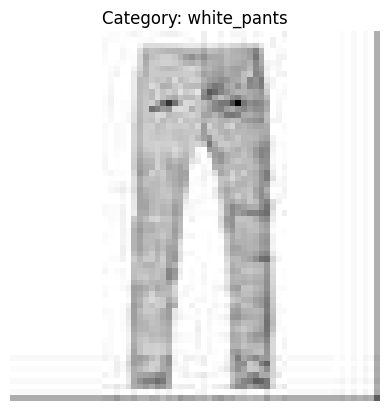

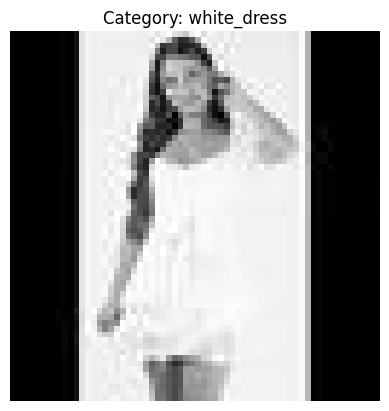

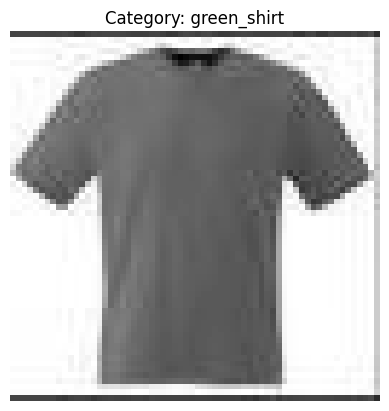

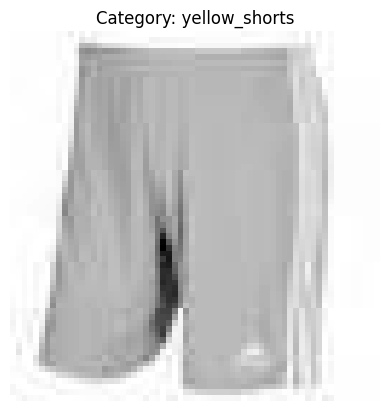

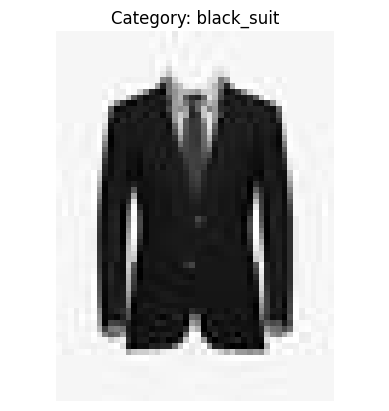

In [ ]:
# Function to show one normalized image per category
def show_normalized_images(normalized_dir):
    categories = os.listdir(normalized_dir)

    # Iterate through each category
    for category in categories:
        category_dir = os.path.join(normalized_dir, category)

        # Check if the category directory is a valid directory
        if os.path.isdir(category_dir):
            # Get a list of normalized image files in the category directory
            image_files = [f for f in os.listdir(category_dir) if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png')]

            # Display one normalized image from the category
            if image_files:
                img_path = os.path.join(category_dir, image_files[0])
                try:
                    img = Image.open(img_path)
                    plt.imshow(img, cmap='gray')
                    plt.title(f"Category: {category}")
                    plt.axis('off')
                    plt.show()
                except Exception as e:
                    print(f"Error opening image {image_files[0]}: {e}")

# Show one normalized image per category
show_normalized_images(normalized_dir)


# **Split Dataset:split ratio is 70% training, 15% validation, and 15% testing**

In [ ]:
from sklearn.model_selection import train_test_split
import shutil

# Define the directories for training, validation, and testing sets
train_dir = '/content/train'
val_dir = '/content/val'
test_dir = '/content/test'

# Create directories for the sets
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Function to split dataset
def split_dataset(input_dir, output_train_dir, output_val_dir, output_test_dir, split_ratio=(0.7, 0.15, 0.15)):
    categories = os.listdir(input_dir)

    for category in categories:
        category_input_dir = os.path.join(input_dir, category)
        category_train_dir = os.path.join(output_train_dir, category)
        category_val_dir = os.path.join(output_val_dir, category)
        category_test_dir = os.path.join(output_test_dir, category)

        os.makedirs(category_train_dir, exist_ok=True)
        os.makedirs(category_val_dir, exist_ok=True)
        os.makedirs(category_test_dir, exist_ok=True)

        # Get list of images for the current category
        images = [f for f in os.listdir(category_input_dir) if f.endswith('.jpg')]

        if len(images) == 0:
            print(f"Warning: Category {category} has no images.")
            continue

        # Split images into train, val, and test sets
        train_size = split_ratio[0] / sum(split_ratio)
        val_size = split_ratio[1] / sum(split_ratio)
        train_images, temp_images = train_test_split(images, test_size=(1.0 - train_size), random_state=42)
        val_images, test_images = train_test_split(temp_images, test_size=val_size / (1.0 - train_size), random_state=42)

        # Copy images to respective directories
        for img in train_images:
            shutil.copy(os.path.join(category_input_dir, img), os.path.join(category_train_dir, img))
        for img in val_images:
            shutil.copy(os.path.join(category_input_dir, img), os.path.join(category_val_dir, img))
        for img in test_images:
            shutil.copy(os.path.join(category_input_dir, img), os.path.join(category_test_dir, img))

# Split the dataset
split_dataset(normalized_dir, train_dir, val_dir, test_dir)


# **TRAIN THE MODELs(DT,SVM,DENSENET)**

# ***DT***

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import os
import numpy as np
from PIL import Image

# Define the directories for training, validation, and testing sets
train_dir = '/content/train'
val_dir = '/content/val'
test_dir = '/content/test'

# Function to load images and labels
def load_data(directory):
    X = []
    y = []
    label_encoder = LabelEncoder()
    categories = os.listdir(directory)
    for category in categories:
        category_dir = os.path.join(directory, category)
        if os.path.isdir(category_dir):
            for file in os.listdir(category_dir):
                try:
                    img = Image.open(os.path.join(category_dir, file))
                    img_array = np.array(img)
                    X.append(img_array.flatten())  # Flatten image array
                    y.append(category)
                except Exception as e:
                    print(f"Error loading image: {e}")
    return np.array(X), label_encoder.fit_transform(y)

# Load training data
X_train, y_train = load_data(train_dir)

# Initialize the Decision Tree classifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Train the Decision Tree classifier
decision_tree.fit(X_train, y_train)


DecisionTreeClassifier(random_state=42)

# **SVM**

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import os
import numpy as np
from PIL import Image

# Define the directories for training, validation, and testing sets
train_dir = '/content/train'
val_dir = '/content/val'
test_dir = '/content/test'

# Function to load images and labels
def load_data(directory):
    X = []
    y = []
    label_encoder = LabelEncoder()
    categories = os.listdir(directory)
    for category in categories:
        category_dir = os.path.join(directory, category)
        if os.path.isdir(category_dir):
            for file in os.listdir(category_dir):
                try:
                    img = Image.open(os.path.join(category_dir, file))
                    img_array = np.array(img)
                    X.append(img_array.flatten())  # Flatten image array
                    y.append(category)
                except Exception as e:
                    print(f"Error loading image: {e}")
    return np.array(X), label_encoder.fit_transform(y)

# Load training data
X_train, y_train = load_data(train_dir)

# Initialize the SVM classifier
svm_classifier = SVC(kernel='linear', random_state=42)  # You can choose different kernels like 'rbf', 'poly', etc.

# Train the SVM classifier
svm_classifier.fit(X_train, y_train)

# After training, you can proceed to evaluate the model.


SVC(kernel='linear', random_state=42)

# **DenseNet-based CNN**

Selecting a subset of classes (6 class)streamlines training by focusing on specific categories, reducing complexity and training time. It simplifies evaluation and can lead to better performance and generalization, particularly in cases of imbalanced data or limited computational resources.

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Define directories for training, validation, and testing sets
train_dir = '/content/train'
val_dir = '/content/val'
test_dir = '/content/test'

# Define image size and batch size
img_size = (224, 224)
batch_size = 32

# Define the selected classes
selected_classes = ['green_suit', 'green_shorts', 'white_shorts', 'brown_hoodie', 'pink_pants', 'green_pants']

# Define data augmentation for training images
train_data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.1),
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255)
])

# Function to filter the selected classes
def filter_selected_classes(directory):
    filtered_images = []
    for root, _, files in os.walk(directory):
        for file in files:
            if any(class_name in root for class_name in selected_classes):
                filtered_images.append(os.path.join(root, file))
    return filtered_images

# Load and preprocess the training images for selected classes
train_images = filter_selected_classes(train_dir)
train_labels = [os.path.basename(os.path.dirname(image)) for image in train_images]

train_ds = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
train_ds = train_ds.map(lambda x, y: (tf.io.read_file(x), y))  # Read image file
train_ds = train_ds.map(lambda x, y: (tf.image.decode_jpeg(x, channels=3), y))  # Decode JPEG image
train_ds = train_ds.map(lambda x, y: (train_data_augmentation(x), y))  # Apply augmentation
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(tf.argmax(tf.cast(tf.equal(selected_classes, y), tf.int32)), len(selected_classes))))

# Load and preprocess the validation images for selected classes
val_images = filter_selected_classes(val_dir)
val_labels = [os.path.basename(os.path.dirname(image)) for image in val_images]

val_ds = tf.data.Dataset.from_tensor_slices((val_images, val_labels))
val_ds = val_ds.map(lambda x, y: (tf.io.read_file(x), y))  # Read image file
val_ds = val_ds.map(lambda x, y: (tf.image.decode_jpeg(x, channels=3), y))  # Decode JPEG image
val_ds = val_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))  # Resize images
val_ds = val_ds.map(lambda x, y: (x / 255.0, tf.one_hot(tf.argmax(tf.cast(tf.equal(selected_classes, y), tf.int32)), len(selected_classes))))

# Load pre-trained DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head with batch normalization
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)
predictions = Dense(len(selected_classes), activation='softmax')(x)

# Combine base model with custom head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze base layers for transfer learning
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
reduce_lr = ReduceLROnPlateau(factor=0.2, patience=3, min_lr=0.0001, verbose=1)
early_stop = EarlyStopping(patience=5, restore_best_weights=True, verbose=1)

# Train the model
history = model.fit(
    train_ds.batch(batch_size),
    epochs=10,  # Increase epochs for better convergence
    validation_data=val_ds.batch(batch_size),
    callbacks=[reduce_lr, early_stop]
)


Epoch 1/10
26/26 [==============================] - 63s 2s/step - loss: 2.5148 - accuracy: 0.1535 - val_loss: 1.7463 - val_accuracy: 0.2717 - lr: 0.0010
Epoch 2/10
26/26 [==============================] - 51s 2s/step - loss: 2.2270 - accuracy: 0.1745 - val_loss: 1.7783 - val_accuracy: 0.2601 - lr: 0.0010
Epoch 3/10
26/26 [==============================] - 38s 2s/step - loss: 2.0647 - accuracy: 0.1894 - val_loss: 1.7983 - val_accuracy: 0.2717 - lr: 0.0010
Epoch 4/10
26/26 [==============================] - 53s 2s/step - loss: 1.9694 - accuracy: 0.1943 - val_loss: 1.7081 - val_accuracy: 0.3121 - lr: 0.0010
Epoch 5/10
26/26 [==============================] - 53s 2s/step - loss: 1.8651 - accuracy: 0.2426 - val_loss: 1.7185 - val_accuracy: 0.2543 - lr: 0.0010
Epoch 6/10
26/26 [==============================] - 50s 2s/step - loss: 1.8357 - accuracy: 0.2191 - val_loss: 1.7119 - val_accuracy: 0.2717 - lr: 0.0010
Epoch 7/10
26/26 [==============================] - ETA: 0s - loss: 1.7871 - accur

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Define directories for training, validation, and testing sets
train_dir = '/content/train'
val_dir = '/content/val'
test_dir = '/content/test'

# Define image size and batch size
img_size = (224, 224)
batch_size = 32

# Define the selected classes
selected_classes = ['green_suit', 'green_shorts', 'white_shorts', 'brown_hoodie', 'pink_pants', 'green_pants']

# Define data augmentation for training images
train_data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.1),
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255)
])

# Function to filter the selected classes
def filter_selected_classes(directory):
    filtered_images = []
    for root, _, files in os.walk(directory):
        for file in files:
            if any(class_name in root for class_name in selected_classes):
                filtered_images.append(os.path.join(root, file))
    return filtered_images

# Load and preprocess the training images for selected classes
train_images = filter_selected_classes(train_dir)
train_labels = [os.path.basename(os.path.dirname(image)) for image in train_images]

train_ds = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
train_ds = train_ds.map(lambda x, y: (tf.io.read_file(x), y))  # Read image file
train_ds = train_ds.map(lambda x, y: (tf.image.decode_jpeg(x, channels=3), y))  # Decode JPEG image
train_ds = train_ds.map(lambda x, y: (train_data_augmentation(x), y))  # Apply augmentation
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(tf.argmax(tf.cast(tf.equal(selected_classes, y), tf.int32)), len(selected_classes))))

# Load and preprocess the validation images for selected classes
val_images = filter_selected_classes(val_dir)
val_labels = [os.path.basename(os.path.dirname(image)) for image in val_images]

val_ds = tf.data.Dataset.from_tensor_slices((val_images, val_labels))
val_ds = val_ds.map(lambda x, y: (tf.io.read_file(x), y))  # Read image file
val_ds = val_ds.map(lambda x, y: (tf.image.decode_jpeg(x, channels=3), y))  # Decode JPEG image
val_ds = val_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))  # Resize images
val_ds = val_ds.map(lambda x, y: (x / 255.0, tf.one_hot(tf.argmax(tf.cast(tf.equal(selected_classes, y), tf.int32)), len(selected_classes))))

# Load pre-trained DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head with batch normalization
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)
predictions = Dense(len(selected_classes), activation='softmax')(x)

# Combine base model with custom head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze base layers for transfer learning
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
reduce_lr = ReduceLROnPlateau(factor=0.2, patience=3, min_lr=0.0001, verbose=1)
early_stop = EarlyStopping(patience=5, restore_best_weights=True, verbose=1)

# Train the model
history = model.fit(
    train_ds.batch(batch_size),
    epochs=10,  # Increase epochs for better convergence
    validation_data=val_ds.batch(batch_size),
    callbacks=[reduce_lr, early_stop]
)


29084464/29084464 [==============================] - 0s 0us/step
Epoch 1/10
26/26 [==============================] - 66s 2s/step - loss: 2.4539 - accuracy: 0.1498 - val_loss: 1.9142 - val_accuracy: 0.1561 - lr: 0.0010
Epoch 2/10
26/26 [==============================] - 53s 2s/step - loss: 2.2627 - accuracy: 0.1770 - val_loss: 1.8570 - val_accuracy: 0.2254 - lr: 0.0010
Epoch 3/10
26/26 [==============================] - 50s 2s/step - loss: 2.1121 - accuracy: 0.2030 - val_loss: 2.0229 - val_accuracy: 0.1965 - lr: 0.0010
Epoch 4/10
26/26 [==============================] - 53s 2s/step - loss: 1.9856 - accuracy: 0.2067 - val_loss: 1.8731 - val_accuracy: 0.1965 - lr: 0.0010
Epoch 5/10
26/26 [==============================] - 51s 2s/step - loss: 1.8875 - accuracy: 0.1881 - val_loss: 1.8352 - val_accuracy: 0.2197 - lr: 0.0010
Epoch 6/10
26/26 [==============================] - 53s 2s/step - loss: 1.8461 - accuracy: 0.2252 - val_loss: 1.8133 - val_accuracy: 0.2081 - lr: 0.0010
Epoch 7/10
26/26 

# **Evaluate THE Models(DT,SVM,DENSENET) With  Accuracy,Confusion Matrix,ROC CURVE**

# **DT**

In [ ]:
# Import necessary libraries
from sklearn.metrics import accuracy_score

# Load validation data
X_val, y_val = load_data(val_dir)

# Predict on validation set
y_pred_decision_tree = decision_tree.predict(X_val)

# Calculate accuracy
accuracy_decision_tree = accuracy_score(y_val, y_pred_decision_tree)

# Print accuracy
print("Decision Tree Accuracy:", accuracy_decision_tree)

Decision Tree Accuracy: 0.3529896907216495


In [ ]:
# Calculate training accuracy
y_pred_train_decision_tree = decision_tree.predict(X_train)
accuracy_train_decision_tree = accuracy_score(y_train, y_pred_train_decision_tree)

# Print training accuracy
print("Decision Tree Training Accuracy:", accuracy_train_decision_tree)


Decision Tree Training Accuracy: 1.0


In [ ]:
# Load testing data
X_test, y_test = load_data(test_dir)

# Predict on testing set
y_pred_test_decision_tree = decision_tree.predict(X_test)

# Calculate testing accuracy
accuracy_test_decision_tree = accuracy_score(y_test, y_pred_test_decision_tree)

# Print testing accuracy
print("Decision Tree Testing Accuracy:", accuracy_test_decision_tree)


Decision Tree Testing Accuracy: 0.3598856209150327


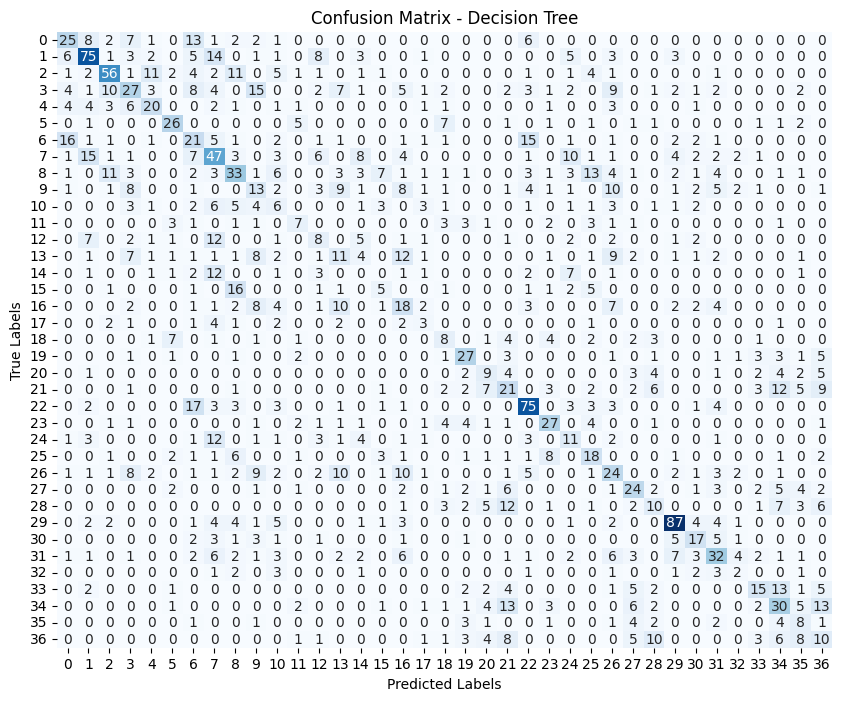

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(y_val, y_pred_decision_tree), annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Decision Tree')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


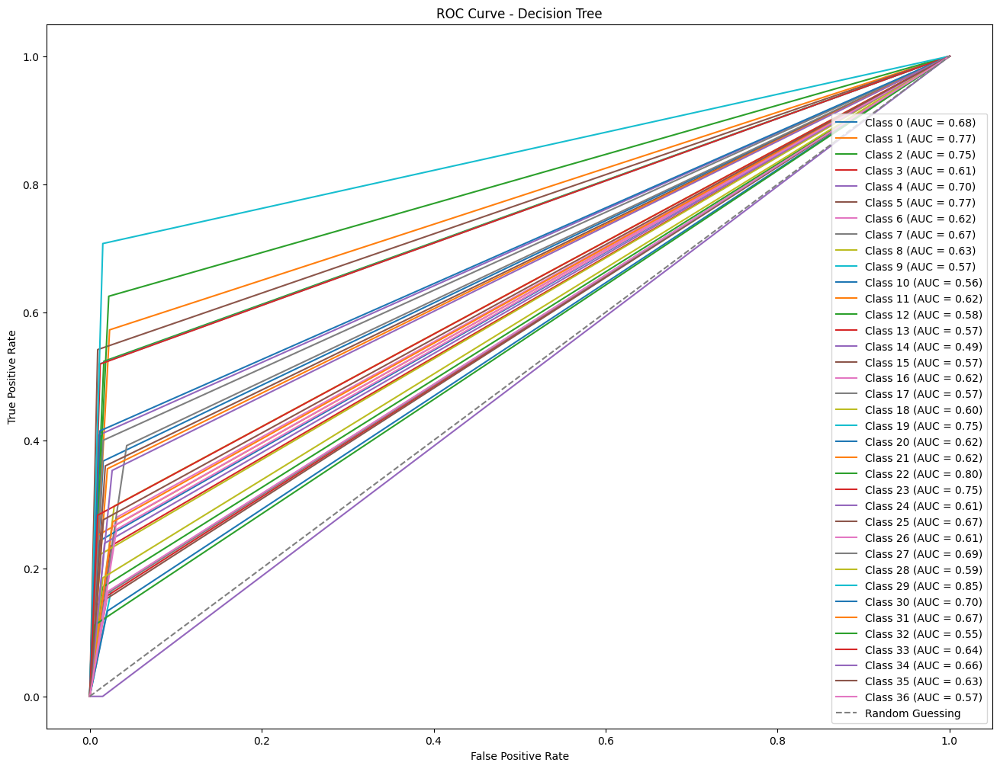

In [ ]:
# Import necessary libraries
from sklearn.metrics import roc_curve, auc

# Get probabilities for each class
y_prob_decision_tree = decision_tree.predict_proba(X_val)

# Plot ROC curve for each class
plt.figure(figsize=(16, 12))  # Adjust the figure size here
for i in range(len(decision_tree.classes_)):
    fpr, tpr, _ = roc_curve((y_val == i).astype(int), y_prob_decision_tree[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

# Plot random guessing line
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guessing')

# Set labels and legend
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Decision Tree')
plt.legend()
plt.show()


# **SVM**

In [ ]:
# Predict on validation set
y_pred_svm = svm_classifier.predict(X_val)

# Calculate accuracy
accuracy_svm = accuracy_score(y_val, y_pred_svm)
print("SVM Accuracy:", accuracy_svm)


SVM Accuracy: 0.42350515463917526


# Calculate training accuracy for SVM

In [ ]:
y_pred_train_svm = svm_classifier.predict(X_train)
accuracy_train_svm = accuracy_score(y_train, y_pred_train_svm)                          #predicted_labels VS the Actual
print("SVM Training Accuracy:", accuracy_train_svm)


SVM Training Accuracy: 1.0


In [ ]:
# Load testing data for SVM
X_test, y_test = load_data(test_dir)

# Predict on testing set
y_pred_test_svm = svm_classifier.predict(X_test)

# Calculate testing accuracy for SVM
accuracy_test_svm = accuracy_score(y_test, y_pred_test_svm)
print("SVM Testing Accuracy:", accuracy_test_svm)


SVM Testing Accuracy: 0.4076797385620915


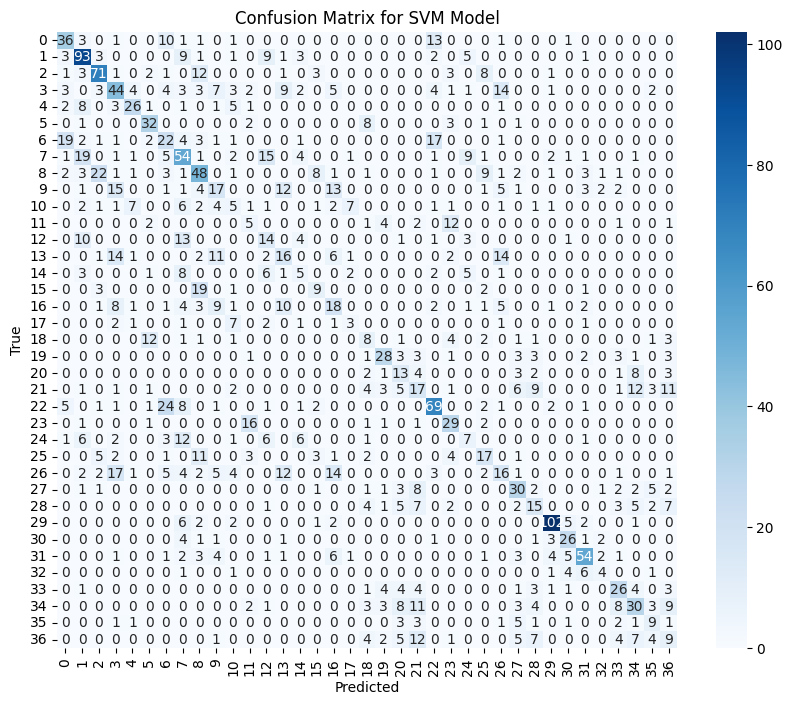

In [ ]:
# Import necessary libraries
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Load validation data
X_val, y_val = load_data(val_dir)

# Predict on validation set
y_pred_svm = svm_classifier.predict(X_val)

# Calculate confusion matrix
conf_matrix_svm = confusion_matrix(y_val, y_pred_svm)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_svm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for SVM Model')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


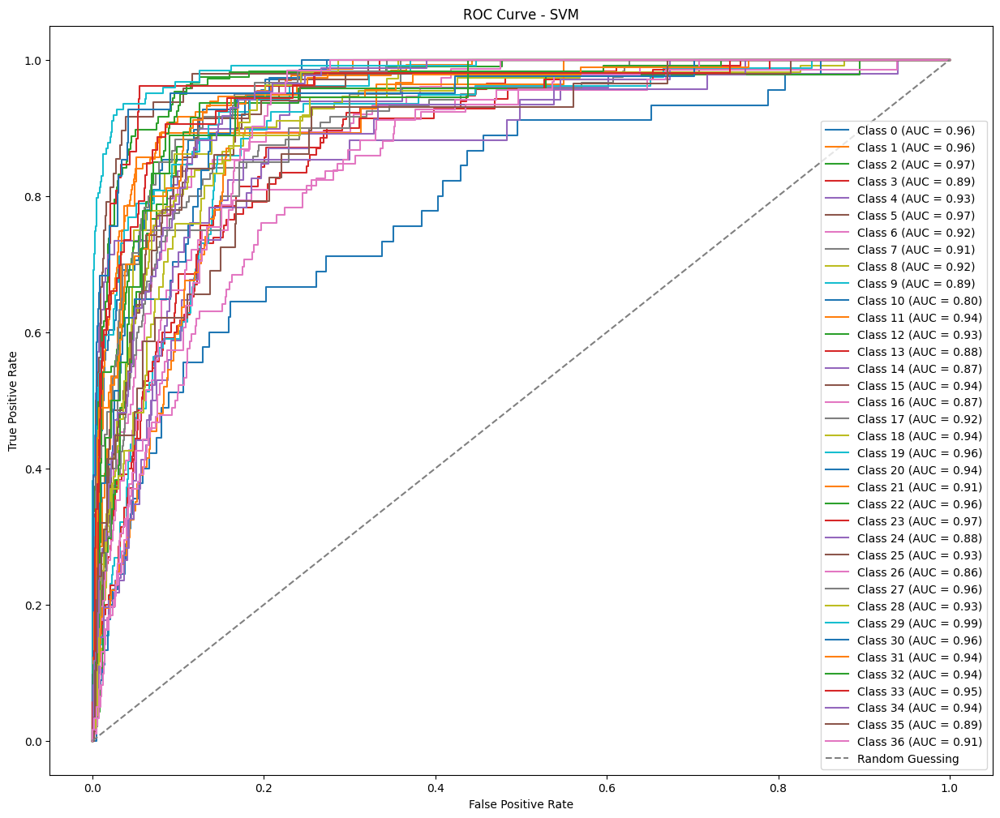

In [ ]:
# Get probabilities for each class
y_prob_svm = svm_classifier.decision_function(X_val)

# Plot ROC curve for each class
plt.figure(figsize=(15, 12))
for i in range(len(svm_classifier.classes_)):
    fpr, tpr, _ = roc_curve((y_val == i).astype(int), y_prob_svm[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

# Plot random guessing line
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guessing')

# Set labels and legend
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVM')
plt.legend()
plt.show()


# **DenseNet**

In [ ]:
# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_ds.batch(batch_size))
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)


6/6 [==============================] - 29s 4s/step - loss: 1.7081 - accuracy: 0.3121
Validation Loss: 1.7081255912780762
Validation Accuracy: 0.31213873624801636


In [ ]:
# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(train_ds.batch(batch_size))
print("Training Loss:", train_loss)
print("Training Accuracy:", train_accuracy)


26/26 [==============================] - 19s 368ms/step - loss: 1.5191 - accuracy: 0.4072
Training Loss: 1.5190786123275757
Training Accuracy: 0.40717822313308716


In [ ]:
snssnssnssnssnssnssnssns# Load and preprocess the testing images for selected classes
test_images = filter_selected_classes(test_dir)
test_labels = [os.path.basename(os.path.dirname(image)) for image in test_images]

test_ds = tf.data.Dataset.from_tensor_slices((test_images, test_labels))
test_ds = test_ds.map(lambda x, y: (tf.io.read_file(x), y))  # Read image file
test_ds = test_ds.map(lambda x, y: (tf.image.decode_jpeg(x, channels=3), y))  # Decode JPEG image
test_ds = test_ds.map(lambda x, y: (tf.image.resize(x, img_size), y))  # Resize images
test_ds = test_ds.map(lambda x, y: (x / 255.0, tf.one_hot(tf.argmax(tf.cast(tf.equal(selected_classes, y), tf.int32)), len(selected_classes))))

# Evaluate the model on the testing set
test_loss, test_accuracy = model.evaluate(test_ds.batch(batch_size))
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


6/6 [==============================] - 36s 5s/step - loss: 1.7212 - accuracy: 0.2079
Test Loss: 1.721178412437439
Test Accuracy: 0.2078651636838913


6/6 [==============================] - 31s 4s/step


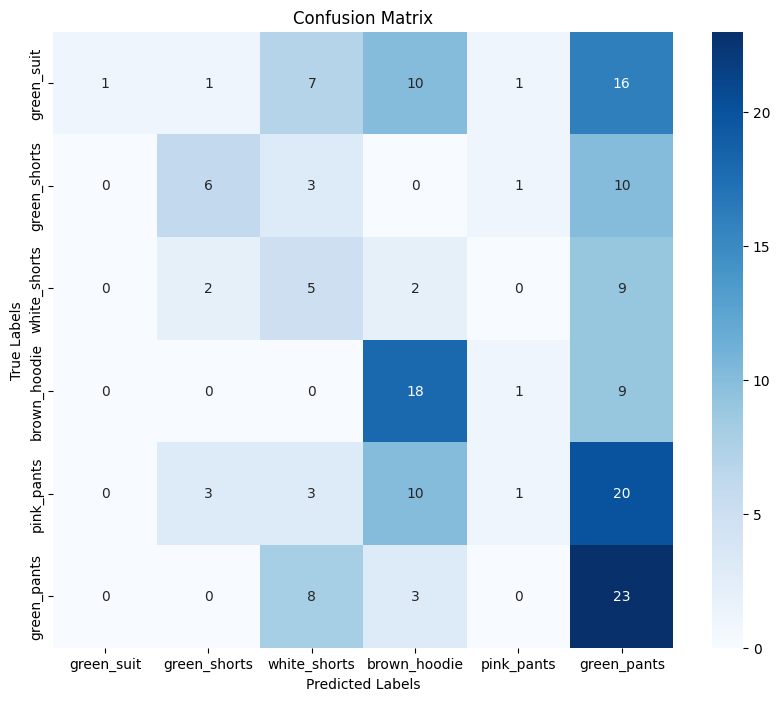

In [ ]:
from sklearn.mmetricsmetricsetrics import confusion_matrix
import seaborn as snssnssnssnssnssnssnssnssnssnssnssnssnssnssnssns

# Predict labels for the validation set
y_pred = model.predict(val_ds.batch(batch_size))
y_pred_labels = np.argmax(y_pred, axis=1)
true_labels = np.argmax(np.array([label.numpy() for _, label in val_ds]), axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, y_pred_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=selected_classes, yticklabels=selected_classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


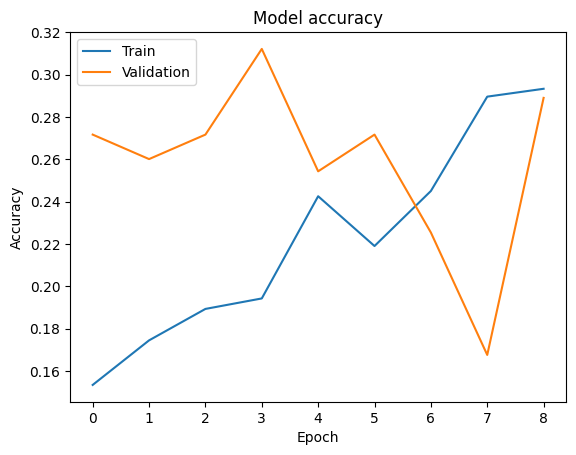

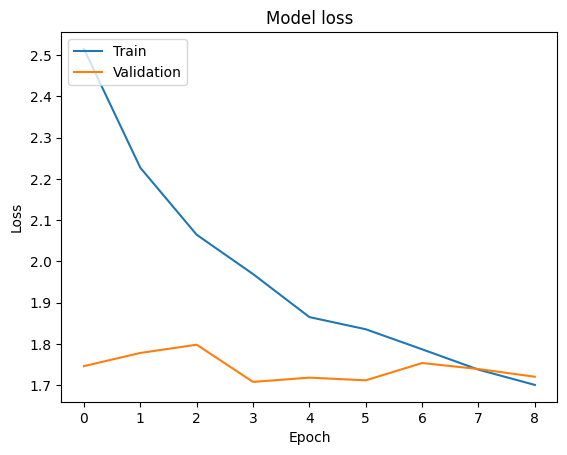

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


6/6 [==============================] - 29s 5s/step


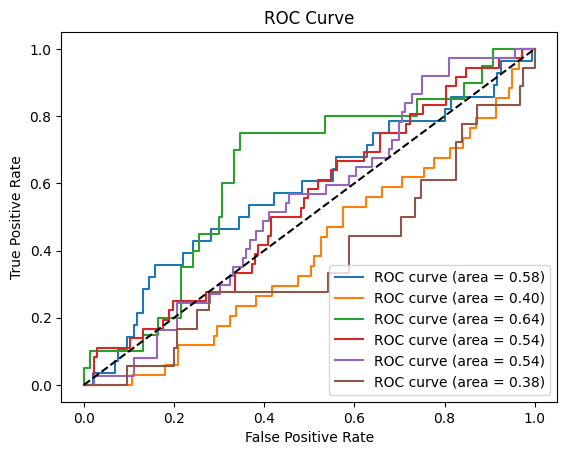

In [ ]:
from sklearn.metrics import roc_curve, auc

# Convert val_labels to a numpy array
val_labels = np.array(val_labels)

# One-hot encode the class labels
label_encoder = LabelEncoder()
val_labels_encoded = label_encoder.fit_transform(val_labels)
val_labels_onehot = tf.keras.utils.to_categorical(val_labels_encoded)

# Predict probabilities for the validation set
y_pred_prob = model.predict(val_ds.batch(batch_size))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(selected_classes)):
    fpr[i], tpr[i], _ = roc_curve(val_labels_onehot[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure()
for i in range(len(selected_classes)):
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()
